In [1]:
import sys
sys.path.insert(0, '/camp/home/maizelr/working/Rory/python_scripts')
from simple_velocity import *
from utils import *

import_my_tools()

/camp/home/maizelr/.local/lib/python3.8/site-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}



        # base packages
        import sys
        import pandas as pd
        import numpy as np
        import scipy as sp      
        import matplotlib.pyplot as plt
        import pickle
        import seaborn as sns
        import pickle
        import adjustText

        # velocity packages
        import scanpy as sc
        import scvelo as scv
        import anndata as ann
        import dynamo as dyn
        import cellrank as cr

        # extra packages
        import plotly as pl
        import plotly.graph_objects as go
        import plotly.express as px
        import ipywidgets as ipy
        


In [2]:
import cellrank as cr

In [3]:
mdata_0 = load_mouse_velocity()
hdata_0 = load_human_velocity()

Loading:  /camp/home/maizelr/working/Rory/transcriptomics/mouse_transcriptomics_data/full_data/new_mouse_velocity_20210121.loom
Variable names made unique.
Loading:  /camp/home/maizelr/working/Rory/transcriptomics/human_transcriptomics_analysis/data/new_human_velocity_20210121.loom
Variable names made unique.


In [4]:
mdata = mdata_0.copy()
sc.pp.normalize_total(mdata, target_sum=1e4)
sc.pp.log1p(mdata)
mdata.strings_to_categoricals()


hdata = hdata_0.copy()
sc.pp.normalize_total(hdata, target_sum=1e4)
sc.pp.log1p(hdata)
hdata.strings_to_categoricals()

... storing 'cell_subtype' as categorical
... storing 'cell_type' as categorical
... storing 'domain' as categorical
... storing 'orig_dataset' as categorical
... storing 'Chromosome' as categorical
... storing 'Strand' as categorical
... storing 'cell_subtype' as categorical
... storing 'cell_type' as categorical
... storing 'domain' as categorical
... storing 'orig_dataset' as categorical
... storing 'region' as categorical
... storing 'sample_id' as categorical
... storing 'timepoint' as categorical
... storing 'Chromosome' as categorical
... storing 'Strand' as categorical


In [5]:
hdata = hdata[hdata.obs.timepoint!='CS17']
mdata = mdata[mdata.obs.timepoint!=8.5]

print(hdata.obs.timepoint.unique())
print(mdata.obs.timepoint.unique())

['CS12', 'CS14', 'CS19']
Categories (3, object): ['CS12', 'CS14', 'CS19']
[ 9.5 10.5 11.5 12.5 13.5]


In [6]:
m_dict = {'V3':['Nkx2-2','Neurog3','Sim1','Olig3','Sox21','Nkx6-1'],
            'MN':['Olig2','Lhx3','Isl1','Neurog2','Sp8','Nkx6-1','Isl2','Mnx1','Slc10a4','Slc18a3','Sox21'],
            'V2':['Sox21','Gata3','Tal1','Lhx3','Vsx2','Foxn4','Neurog2','Ascl1','Lhx1','Lhx5','Neurog1','Msx1',
                  'Irx3','Irx5','Pax6','Sp8','Nkx6-1','Bhlhe22','Sox14'],
            'V1':['Nkx6-2','En1','Dbx1','Dbx2','Pax2','Otp','Neurog2','Foxd3','Lhx1','Lhx5','Neurog1','Msx1',
                  'Irx3','Irx5','Pax6','Sp8','Prdm12','Pax8'],
            'V0':['Irx3','Irx5','Pax6','Dbx2','Dbx1','Sp8','Lhx1','Lhx5','Evx1','Evx2','Pitx2','Olig3',
                  'Neurog1','Neurog2','Sox21'],
            'dl6':['Pax3','Pax6','Pax7','Irx3','Irx5','Dbx1','Dbx2','Sp8','Lhx1','Lhx5','Pax8','Lbx1','Pax2',
                   'Dmrt3','Wt1','Neurog1','Ascl1','Neurog2','Lbx1','Sox21'],
            'dl5':['Pax3','Pax6','Pax7','Irx3','Irx5','Gsx2','Dbx2','Pou4f1','Tlx3','Prrxl1','Lbx1','Gsx1','Gsx2',
                   'Lmx1b','Ascl1','Sox21'],
            'dl4':['Pax3','Pax6','Pax7','Irx3','Irx5','Gsx2','Ascl1','Gbx2','Gsx1','Lhx1','Lhx5','Pax8','Lbx1',
                   'Pax2','Gbx1','Ptf1a','Neurog1','Sox21'],
            'dl3':['Pax3','Olig3','Pax7','Irx3','Irx5','Pax6','Gsx2','Ascl1','Gbx2','Pou4f1','Tlx3','Isl1','Prrxl1',
                   'Otp','Msx1','Neurog1','Neurog2','Sox21'],
            'dl2':['Pax3','Olig3','Pax7','Irx3','Irx5','Pax6','Msx1','Pou4f1','Foxd3','Lhx1','Lhx5',
                   'Neurog1','Neurog2','Sox21'],
            'dl1':['Pax3','Olig3','Pax7','Irx3','Irx5','Pax6','Msx1','Msx2','Pou4f1','Lhx2','Lhx9','Barhl1','Barhl2',
                   'Atoh1','Sox21']}

h_dict = {}
for key, item in m_dict.items():
    h_dict[key] = [a.upper() for a in item]
    
domains = ['V3','MN','V2','V1','V0','dl6','dl5','dl4','dl3','dl2','dl1']
datas = {'mouse':mdata,'human':hdata}
dictodict = {'mouse':m_dict,'human':h_dict}


def temporal_BROV_genes(data, species, n=2000):
    """ temporally stratified biologically relevant or variable genes"""
    gene_sets = []
    for time in data.obs.timepoint.unique():
        copy = data.copy()
        copy = copy[copy.obs.timepoint==time]
        scv.pp.filter_genes_dispersion(copy, n_top_genes=n)
        tp_genes = copy.var_names  
        gene_sets.append(tp_genes)
    hv_genes = set(gene_sets[0]).intersection(*gene_sets[1:])
    print("HV ",len(hv_genes))
    br_genes = gene_list('nt', species=species)
    print("BR ",len(br_genes))
    genes = list(set(hv_genes).union(set(br_genes)))
    genes = list(set(genes).intersection(set(data.var_names)))
    return genes

In [7]:
# no V0 because there are too few cells
# dom_list = ['V3','MN','V2','V1','dl6','dl5','dl4','dl3','dl2','dl1']

# m_sets = [[0.2,2,1,'Neuron'],
#           [0.2,2,1,'Neuron'],
#           [0.3,2,1,'Neuron'],
#           [0.2,2,1,'Neuron'],
#           [0.2,2,1,'Neuron'],
#           [0.2,2,1,'Neuron'],
#           [0.2,2,1,'Neuron'],
#           [0.2,2,1,'Neuron'],
#           [0.2,2,1,'Neuron'],
#           [0.2,2,1,'Neuron']]

# h_sets = [[0.2,2,1,'Neuron'],
#           [0.7,2,1,'Neuron'],
#           [0.7,2,1,'Neuron'],
#           [0.2,2,1,'Neuron'],
#           [0.2,2,1,'Neuron'],
#           [0.2,2,1,'Neuron'],
#           [0.2,2,1,'Neuron'],
#           [0.2,2,1,'Neuron'],
#           [0.2,2,1,'Neuron'],
#           [0.2,2,1,'Neuron']]


In [8]:
def run_dynamics(adata, species, domain, weight, terminal, initial):
    print("Processing {0}...".format(domain))
    dom_data = adata[adata.obs.domain==domain]
    'Selecting Genes...'
    dom_genes = temporal_BROV_genes(dom_data, species, n=2000)
    print('{0} Genes Total.'.format(len(dom_genes)))
    dom_data = dom_data[:,dom_genes]
    scv.pp.moments(dom_data, n_pcs=30, n_neighbors=30)
    scv.tl.recover_dynamics(dom_data)
    scv.tl.velocity(dom_data, mode='stochastic')
    scv.tl.velocity_graph(dom_data)
    scv.tl.velocity_embedding(dom_data, basis='pca')
    scv.tl.latent_time(dom_data)
    sc.tl.rank_genes_groups(dom_data, groupby='cell_type', n_genes=8)
    cr.tl.terminal_states(dom_data, cluster_key='cell_type', weight_connectivities=weight, n_states=terminal);
    cr.tl.initial_states(dom_data, cluster_key='cell_type', n_states=initial)
    cr.tl.lineages(dom_data)
    scv.tl.recover_latent_time(dom_data, root_key='initial_states_probs', end_key='terminal_states_probs')
    fig = plt.figure(figsize=(36,16))
    (ax1, ax2, ax3), (ax4, ax5, ax6)  = fig.subplots(nrows=2, ncols=3)
    scv.pl.velocity_embedding_stream(dom_data, color=['cell_subtype'],
                                     basis='pca', legend_fontsize=22, title=[f'{domain} PCA: Cell Type'], 
                                     smooth=.8, min_mass=4, figsize=(12,8), fontsize=22, dpi=400, ax=ax1, show=False)
    scv.pl.velocity_embedding_stream(dom_data, color=['timepoint'], color_map='gnuplot',
                                     basis='pca', legend_fontsize=12, title=['B. PCA: Timepoint'], 
                                     smooth=.8, min_mass=4, figsize=(12,8), fontsize=22, dpi=400, ax=ax2, show=False)
    scv.pl.velocity_embedding_stream(dom_data, color=['latent_time'],color_map='viridis',
                                     basis='pca', legend_fontsize=12, title=['C. PCA: Latent Time'], 
                                     smooth=.8, min_mass=4, figsize=(12,8), fontsize=22, dpi=400, ax=ax3, show=False)
    cr.pl.terminal_states(dom_data, discrete=True, title='D. Predicted Terminal States', dpi=400,
                          fontsize=22, figsize=(12,8), legend_fontsize=22, size=500, ax=ax4, show=False)
    cr.pl.lineages(dom_data, same_plot=True, show=False, fontsize=22, ax=ax5, dpi=400, title='Lineages')
    cr.pl.initial_states(dom_data, discrete=True, title='F. Predicted Initial State (One Enforced)', dpi=400,
                          fontsize=22, figsize=(12,8), legend_fontsize=22, size=500, ax=ax6, show=False)
    plt.show()
    return dom_data

Trying to set attribute `.obs` of view, copying.


V3 :
Processing V3...


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.
Exctracted 2009 highly variable genes.
HV  194
BR  177
342 Genes Total.
Normalized count data: spliced, unspliced.
computing neighbors
    finished (0:00:06) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics
    finished (0:00:25) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph


/camp/home/maizelr/.local/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:683: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/camp/home/maizelr/.local/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:686: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)
computing terminal states
    identified 0 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)



computing latent time using initial_states_probs, terminal_states_probs as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


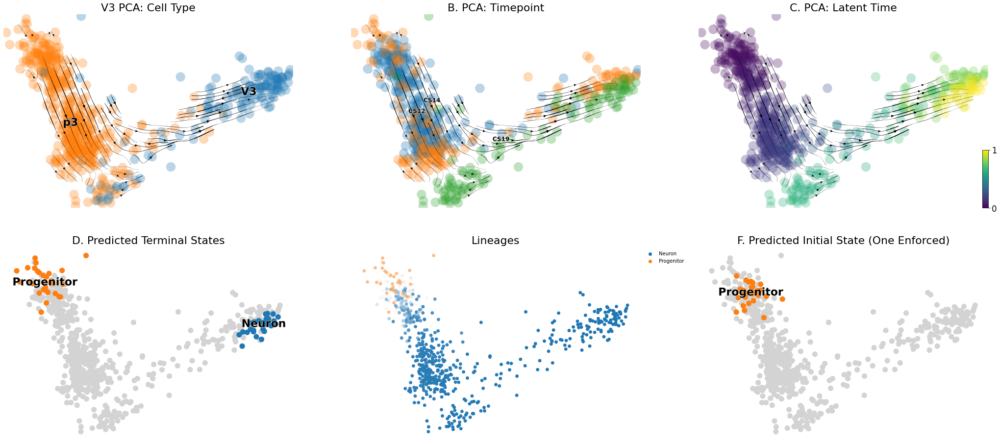

Trying to set attribute `.obs` of view, copying.


Processing V3...


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.


Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.
Exctracted 2000 highly variable genes.


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.
Exctracted 2000 highly variable genes.
HV  76
BR  177
245 Genes Total.
Normalized count data: spliced, unspliced.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics
    finished (0:00:17) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
... 100%

/camp/home/maizelr/.local/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:683: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/camp/home/maizelr/.local/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:686: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)
computing terminal states
    identified 0 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)



computing latent time using initial_states_probs, terminal_states_probs as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


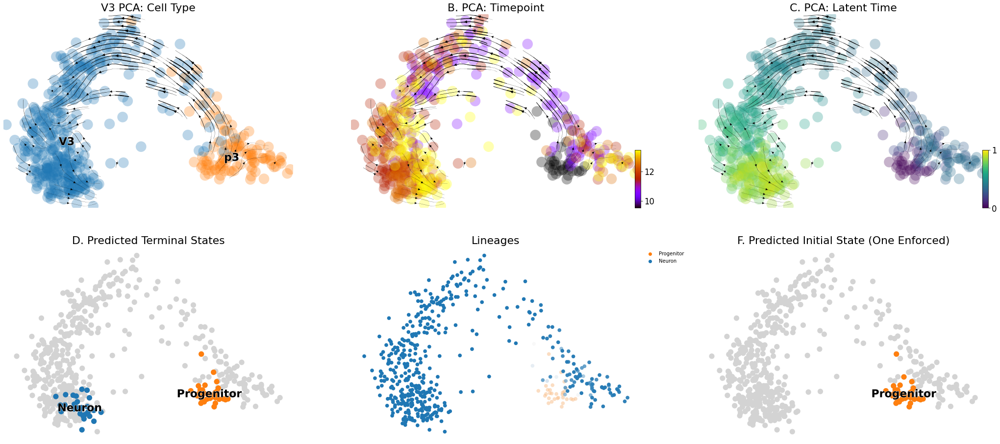

Trying to set attribute `.obs` of view, copying.


MN :
Processing MN...


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.
Exctracted 2000 highly variable genes.
HV  175
BR  177
325 Genes Total.
Normalized count data: spliced, unspliced.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics
    finished (0:00:50) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


/camp/home/maizelr/.local/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:683: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/camp/home/maizelr/.local/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:686: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


computing velocity graph
    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)
computing terminal states
    identified 0 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)



computing latent time using initial_states_probs, terminal_states_probs as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


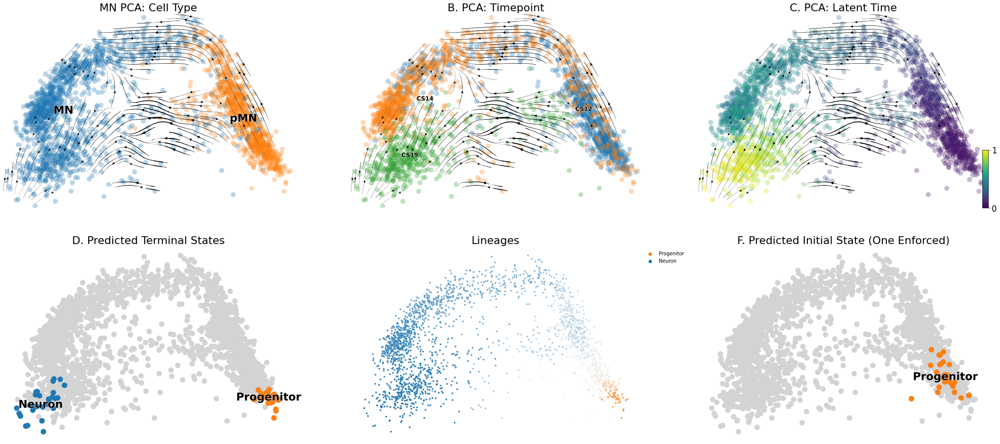

Trying to set attribute `.obs` of view, copying.


Processing MN...


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.
Exctracted 2000 highly variable genes.


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.
HV  177
BR  177
329 Genes Total.
Normalized count data: spliced, unspliced.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics
    finished (0:00:54) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph


/camp/home/maizelr/.local/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:683: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/camp/home/maizelr/.local/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:686: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)
computing terminal states
    identified 1 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)



computing latent time using initial_states_probs, terminal_states_probs as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


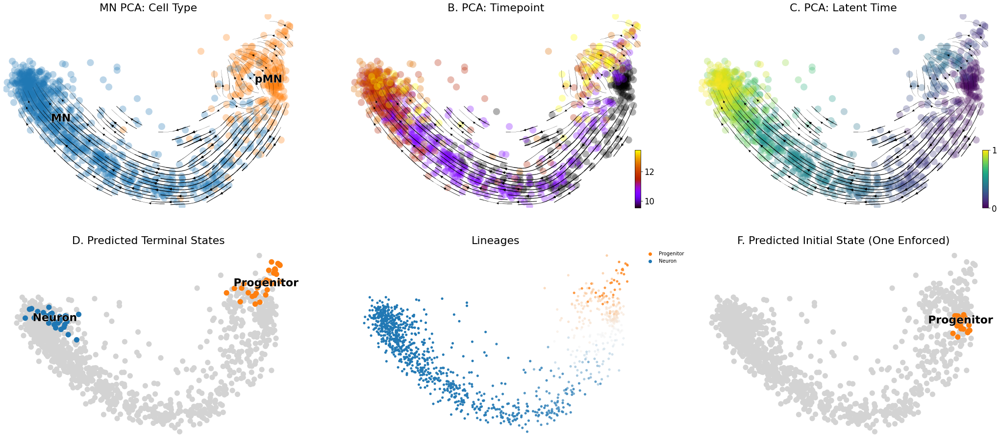

Trying to set attribute `.obs` of view, copying.


V2 :
Processing V2...


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.
Exctracted 2005 highly variable genes.
HV  298
BR  177
428 Genes Total.
Normalized count data: spliced, unspliced.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics
    finished (0:00:53) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph


/camp/home/maizelr/.local/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:683: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/camp/home/maizelr/.local/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:686: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)
computing terminal states
    identified 0 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)



computing latent time using initial_states_probs, terminal_states_probs as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


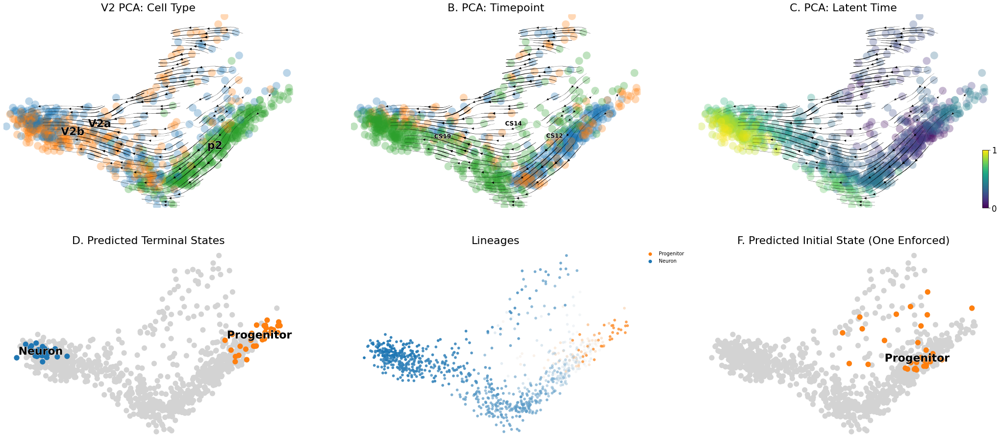

Trying to set attribute `.obs` of view, copying.


Processing V2...


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.
Exctracted 2009 highly variable genes.
HV  168
BR  177
316 Genes Total.
Normalized count data: spliced, unspliced.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics
    finished (0:01:03) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph


/camp/home/maizelr/.local/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:683: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/camp/home/maizelr/.local/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:686: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)
computing terminal states
    identified 1 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)



computing latent time using initial_states_probs, terminal_states_probs as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


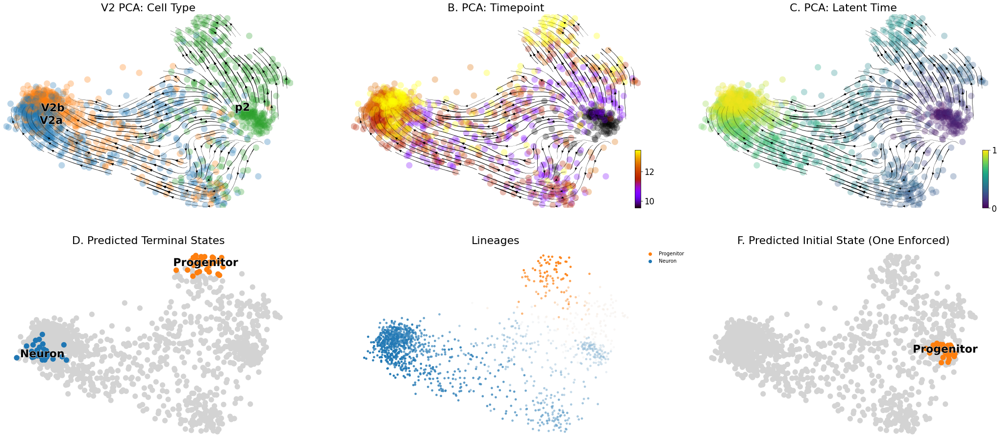

Trying to set attribute `.obs` of view, copying.


V1 :
Processing V1...


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.
Exctracted 2000 highly variable genes.


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.
HV  254
BR  177
395 Genes Total.
Normalized count data: spliced, unspliced.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics
    finished (0:00:34) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph


/camp/home/maizelr/.local/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:683: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/camp/home/maizelr/.local/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:686: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)
computing terminal states
    identified 1 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)



computing latent time using initial_states_probs, terminal_states_probs as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


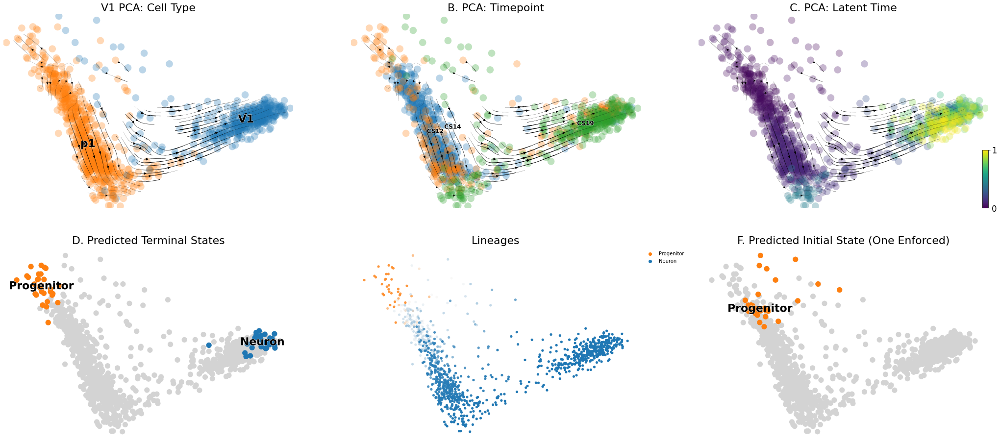

Trying to set attribute `.obs` of view, copying.


Processing V1...
Exctracted 2000 highly variable genes.


Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.


Exctracted 2001 highly variable genes.


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.
Exctracted 2000 highly variable genes.
HV  125
BR  177
272 Genes Total.
Normalized count data: spliced, unspliced.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics
    finished (0:00:37) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph


/camp/home/maizelr/.local/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:683: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/camp/home/maizelr/.local/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:686: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)
computing terminal states
    identified 1 region of root cells and 2 regions of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)



computing latent time using initial_states_probs, terminal_states_probs as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


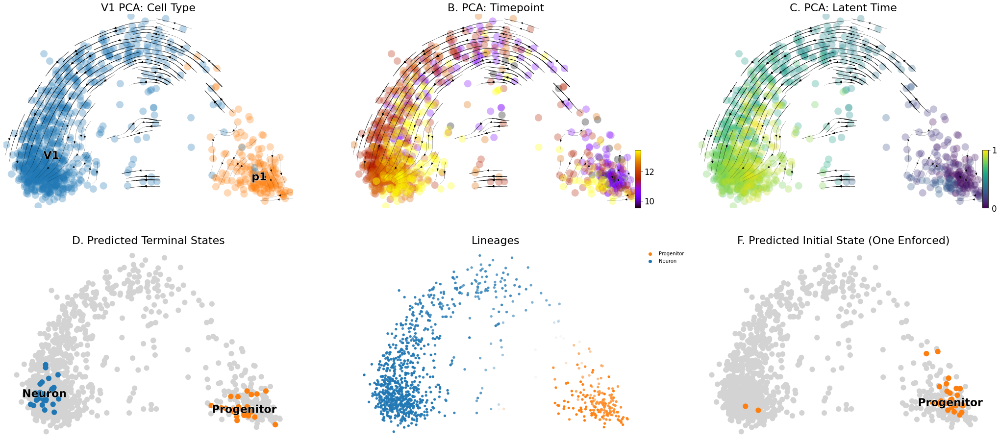

dl4 :
Processing dl4...


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.
HV  254
BR  177
396 Genes Total.
Normalized count data: spliced, unspliced.
computing neighbors
    finished (0:00:01) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics


/camp/home/maizelr/.local/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:683: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/camp/home/maizelr/.local/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:686: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


    finished (0:03:41) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:05) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:02) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)
computing terminal states
    identified 1 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)



computing latent time using initial_states_probs, terminal_states_probs as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


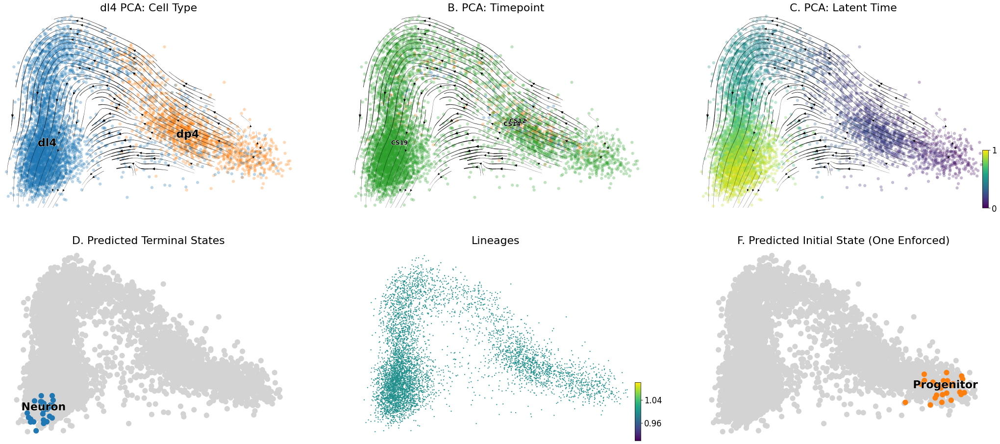

Processing dl4...


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.
HV  208
BR  177
350 Genes Total.
Normalized count data: spliced, unspliced.
computing neighbors
    finished (0:00:01) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics


/camp/home/maizelr/.local/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:683: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/camp/home/maizelr/.local/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:686: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


    finished (0:05:16) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:05) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:02) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)
computing terminal states
    identified 0 region of root cells and 1 region of end points .
    finished (0:00:01) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:01) --> added 
    'latent_time', shared time (adata.obs)



computing latent time using initial_states_probs, terminal_states_probs as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


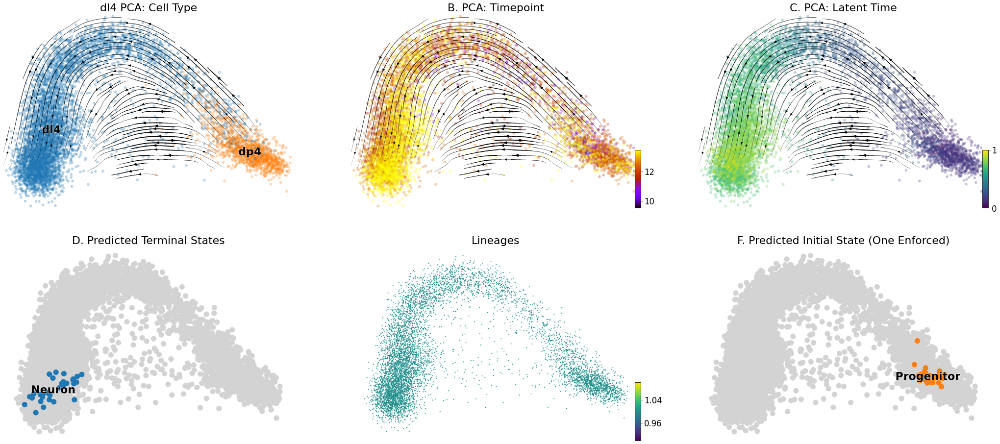

Trying to set attribute `.obs` of view, copying.


dl3 :
Processing dl3...


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.


Trying to set attribute `.obs` of view, copying.


Exctracted 2001 highly variable genes.
Exctracted 2000 highly variable genes.
HV  319
BR  177
457 Genes Total.
Normalized count data: spliced, unspliced.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics
    finished (0:01:51) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities


/camp/home/maizelr/.local/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:683: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/camp/home/maizelr/.local/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:686: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)
computing terminal states
    identified 1 region of root cells and 2 regions of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)



computing latent time using initial_states_probs, terminal_states_probs as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


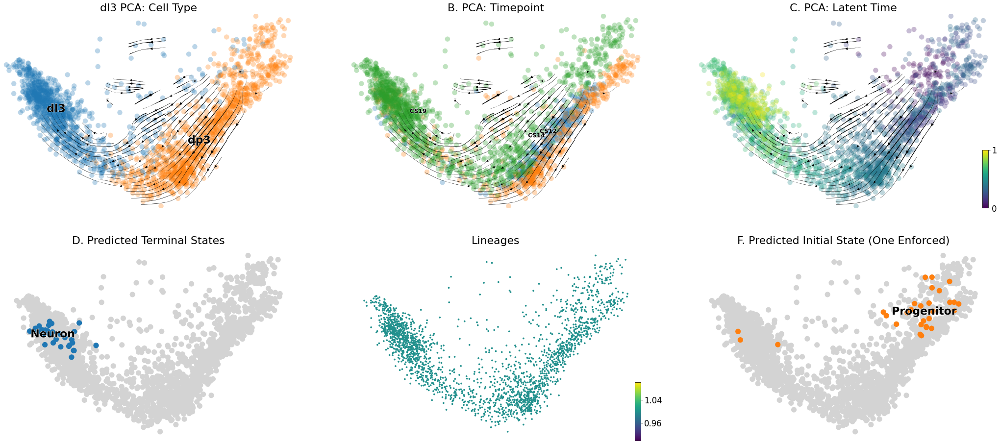

Trying to set attribute `.obs` of view, copying.


Processing dl3...


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.
Exctracted 2000 highly variable genes.
HV  209
BR  177
359 Genes Total.
Normalized count data: spliced, unspliced.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics
    finished (0:02:16) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities


/camp/home/maizelr/.local/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:683: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/camp/home/maizelr/.local/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:686: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)
computing terminal states
    identified 0 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)



computing latent time using initial_states_probs, terminal_states_probs as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


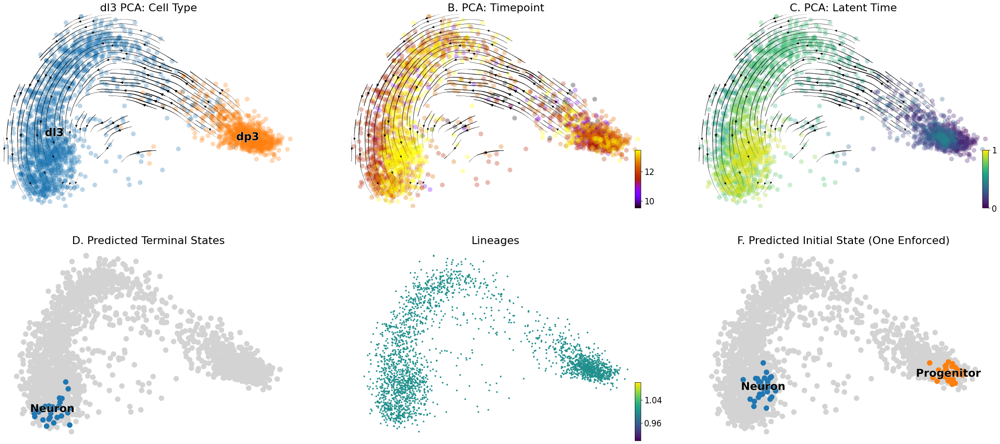

Trying to set attribute `.obs` of view, copying.


dl2 :
Processing dl2...


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.


Trying to set attribute `.obs` of view, copying.


Exctracted 2002 highly variable genes.
Exctracted 2000 highly variable genes.
HV  302
BR  177
442 Genes Total.
Normalized count data: spliced, unspliced.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics
    finished (0:01:28) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities


/camp/home/maizelr/.local/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:683: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/camp/home/maizelr/.local/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:686: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)
computing terminal states
    identified 1 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)



computing latent time using initial_states_probs, terminal_states_probs as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


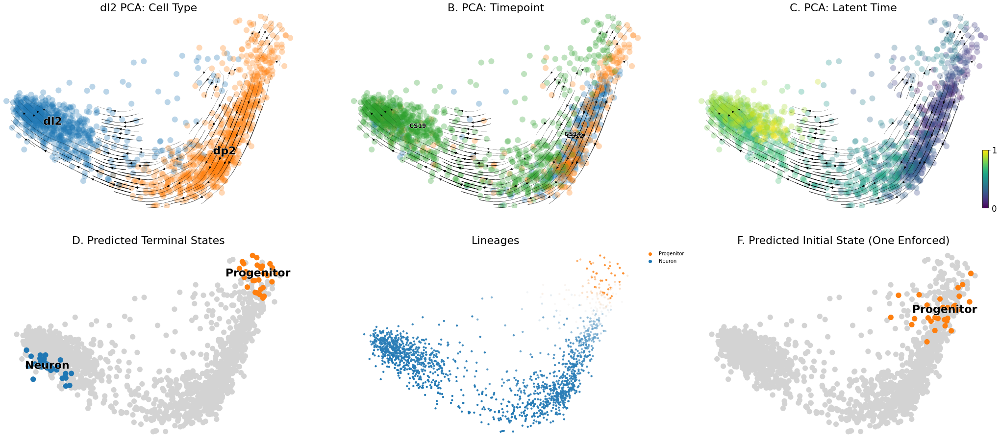

Trying to set attribute `.obs` of view, copying.


Processing dl2...


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.


Trying to set attribute `.obs` of view, copying.


Exctracted 2000 highly variable genes.
Exctracted 2000 highly variable genes.
HV  172
BR  177
313 Genes Total.
Normalized count data: spliced, unspliced.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics
    finished (0:01:22) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph


/camp/home/maizelr/.local/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:683: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/camp/home/maizelr/.local/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:686: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)
computing terminal states
    identified 1 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)



computing latent time using initial_states_probs, terminal_states_probs as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


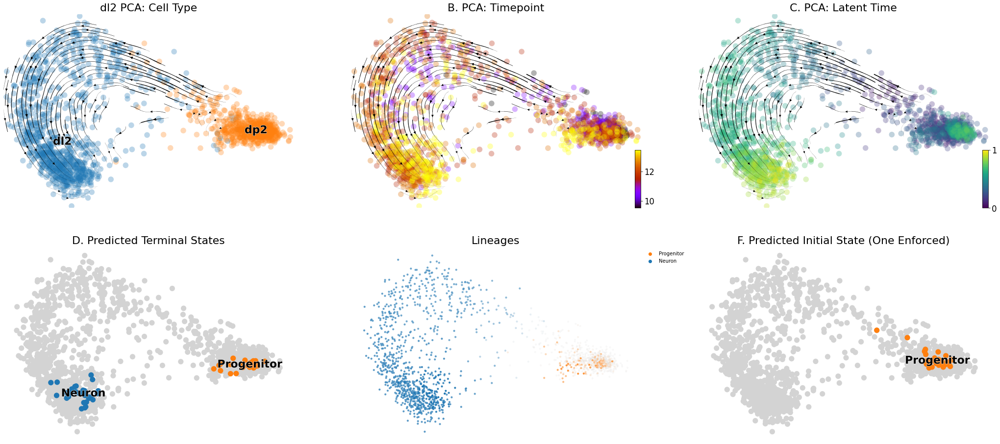

CPU times: user 27min 46s, sys: 12min 40s, total: 40min 27s
Wall time: 26min 1s


In [9]:
%%time

h_datas = []
m_datas = []

dom_list = ['V3','MN','V2','V1','dl4','dl3','dl2']
h_sets = [[0.2,2,1,'Neuron'],
          [0.7,2,1,'Neuron'],
          [0.7,2,1,'Neuron'],
          [0.2,2,1,'Neuron'],
          [0.7,1,1,'Neuron'],
          [0.9,1,1,'Neuron'],
          [0.5,2,1,'Neuron']]
m_sets = [[0.2,2,1,'Neuron'],
          [0.2,2,1,'Neuron'],
          [0.3,2,1,'Neuron'],
          [0.2,2,1,'Neuron'],
          [0.7,1,1,'Neuron'],
          [0.7,1,2,'Neuron'],
          [0.5,2,1,'Neuron']]

for dom, hs, ms in zip(dom_list, h_sets, m_sets):
    print(dom, ':')
    h_datas.append(run_dynamics(hdata, 'human', dom, hs[0], hs[1], hs[2]))
    m_datas.append(run_dynamics(mdata, 'mouse', dom, ms[0], ms[1], ms[2]))

In [15]:
def get_trends(adata, genes, lineage, norm=False, n_knots=6, n_order=3, n_points=200):
    datmat = np.zeros((len(genes),n_points))
    conint = np.zeros(len(genes))
    failed = np.zeros(len(genes))
    fail = 0
    fgenes = []
    for i, gene in enumerate(genes):
        try:
            model = cr.ul.models.GAM(adata, n_knots=n_knots, spline_order=n_order)
            model.prepare(gene, lineage, n_test_points=n_points)
            model.fit()
            y = model.predict()
            ci = model.confidence_interval()
            c = np.max(np.abs(ci[:,0] - ci[:,1]))
            if norm:
                y = (y-y.min())/(y.max()-y.min())
            datmat[i,:] = y
            conint[i] = c
        except RuntimeError:
            fail += 1
            fgenes.append(gene)
            failed[i] = 1
    if fail > 0:
        print(f"Warning: failed to model {fail} genes:")
    for g in fgenes:
        print(g,end=' ')
    print()
    return datmat, conint, failed

    

In [17]:
def normalise_trends(X):
    X = [np.nan_to_num(x) for x in X]
    maxs = np.max(np.array([x.max(axis=1) for x in X]).T, axis=1)
    mins = np.min(np.array([x.min(axis=1) for x in X]).T, axis=1)
    new_X = [((x.T-mins)/(maxs-mins)).T for x in X]
    return new_X
        
def process_trends(X, C, p=10):
    tmp_X = []
    C_score = []
    for x, c in zip(X,C):
        cs = np.zeros_like(c)
        for i, ci in enumerate(c):
            if ci>p:
                x[i,:] = np.zeros_like(x[i,:])
                cs[i] = 1
        tmp_X.append(x)
        C_score.append(cs)
    X = [np.nan_to_num(x) for x in tmp_X]
    maxs = np.max(np.array([x.max(axis=1) for x in X]).T, axis=1)
    mins = np.min(np.array([x.min(axis=1) for x in X]).T, axis=1)
    new_X = [((x.T-mins)/(maxs-mins)).T for x in X]
    return new_X, C_score


In [18]:
# m_genes = ['Sox2','Elavl3','Pax3','Olig3','Lhx2','Pou4f1','Neurog1','Neurod4','Lhx1','Lhx5','Foxd3','Ascl1',
#            'Neurog2','Isl1','Otp','Pax2',
#            'Nkx6-2','En1','Foxn4','Vsx2','Lhx3','Sox21','Gata3','Tal1','Tlx3','Bhlhe22','Irx3','Irx5','Pax6',
#            'Olig2','Nkx2-2','Neurog3','Sim1','Nfia','Nfib','Zfhx4','Zfhx3','Pou2f2','Onecut2','Neurod6','Neurod2']

m_genes = ['Sox2','Elavl3','Pax3','Olig3','Pou4f1','Neurog1','Neurod4','Lhx1','Lhx5','Foxd3','Ascl1',
           'Neurog2','Isl1','Pax2',
           'Nkx6-2','En1','Lhx3','Sox21','Gata3','Tal1','Tlx3','Bhlhe22','Irx3','Irx5','Pax6',
           'Olig2','Nkx2-2','Neurog3']



h_genes = [g.upper() for g in m_genes]

In [19]:
# h_genes=["ELAVL3", "NEUROG2", "NEUROD4", "NEUROG3"]
# m_genes=[g.lower().capitalize() for g in h_genes]
hX, hC, hF = [], [], []
mX, mC, mF = [], [], []
for h, m in zip(h_datas, m_datas):
    hx, hc, hf = get_trends(h, h_genes, n_knots=5, n_order=2, lineage='Neuron') 
    mx, mc, mf = get_trends(m, m_genes, n_knots=5, n_order=2, lineage='Neuron') 
    hX.append(hx)
    hC.append(hc)
    hF.append(hf)
    mX.append(mx)
    mC.append(mc)
    mF.append(mf)

did not converge
did not converge
did not converge

did not converge
did not converge
did not converge
Gata3 
did not converge
TAL1 
did not converge
did not converge
did not converge

did not converge
did not converge

did not converge


Nkx2-2 

did not converge

did not converge
did not converge
did not converge

did not converge
did not converge
did not converge
did not converge

did not converge
did not converge
did not converge

did not converge
did not converge



In [20]:
hX2, hCS = process_trends(hX, hC)
mX2, mCS = process_trends(mX, mC)

genes = h_genes

doms = dom_list

V3: SOX2 ELAVL3 PAX3 OLIG3 POU4F1 NEUROG1 NEUROD4 LHX1 LHX5 FOXD3 ASCL1 NEUROG2 ISL1 PAX2 NKX6-2 EN1 LHX3 SOX21 GATA3 TAL1 TLX3 BHLHE22 IRX3 IRX5 PAX6 OLIG2 NKX2-2 NEUROG3 MN: SOX2 ELAVL3 PAX3 OLIG3 POU4F1 NEUROG1 NEUROD4 LHX1 LHX5 FOXD3 ASCL1 NEUROG2 ISL1 PAX2 NKX6-2 EN1 LHX3 SOX21 GATA3 TAL1 TLX3 BHLHE22 IRX3 IRX5 PAX6 OLIG2 NKX2-2 NEUROG3 V2: SOX2 ELAVL3 PAX3 OLIG3 POU4F1 NEUROG1 NEUROD4 LHX1 LHX5 FOXD3 ASCL1 NEUROG2 ISL1 PAX2 NKX6-2 EN1 LHX3 SOX21 GATA3 TAL1 TLX3 BHLHE22 IRX3 IRX5 PAX6 OLIG2 NKX2-2 NEUROG3 V1: SOX2 ELAVL3 PAX3 OLIG3 POU4F1 NEUROG1 NEUROD4 LHX1 LHX5 FOXD3 ASCL1 NEUROG2 ISL1 PAX2 NKX6-2 EN1 LHX3 SOX21 GATA3 TAL1 TLX3 BHLHE22 IRX3 IRX5 PAX6 OLIG2 NKX2-2 NEUROG3 dl4: SOX2 ELAVL3 PAX3 OLIG3 POU4F1 NEUROG1 NEUROD4 LHX1 LHX5 FOXD3 ASCL1 NEUROG2 ISL1 PAX2 NKX6-2 EN1 LHX3 SOX21 GATA3 TAL1 TLX3 BHLHE22 IRX3 IRX5 PAX6 OLIG2 NKX2-2 NEUROG3 dl3: SOX2 ELAVL3 PAX3 OLIG3 POU4F1 NEUROG1 NEUROD4 LHX1 LHX5 FOXD3 ASCL1 NEUROG2 ISL1 PAX2 NKX6-2 EN1 LHX3 SOX21 GATA3 TAL1 TLX3 BHLHE22 IR

<timed exec>:61: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


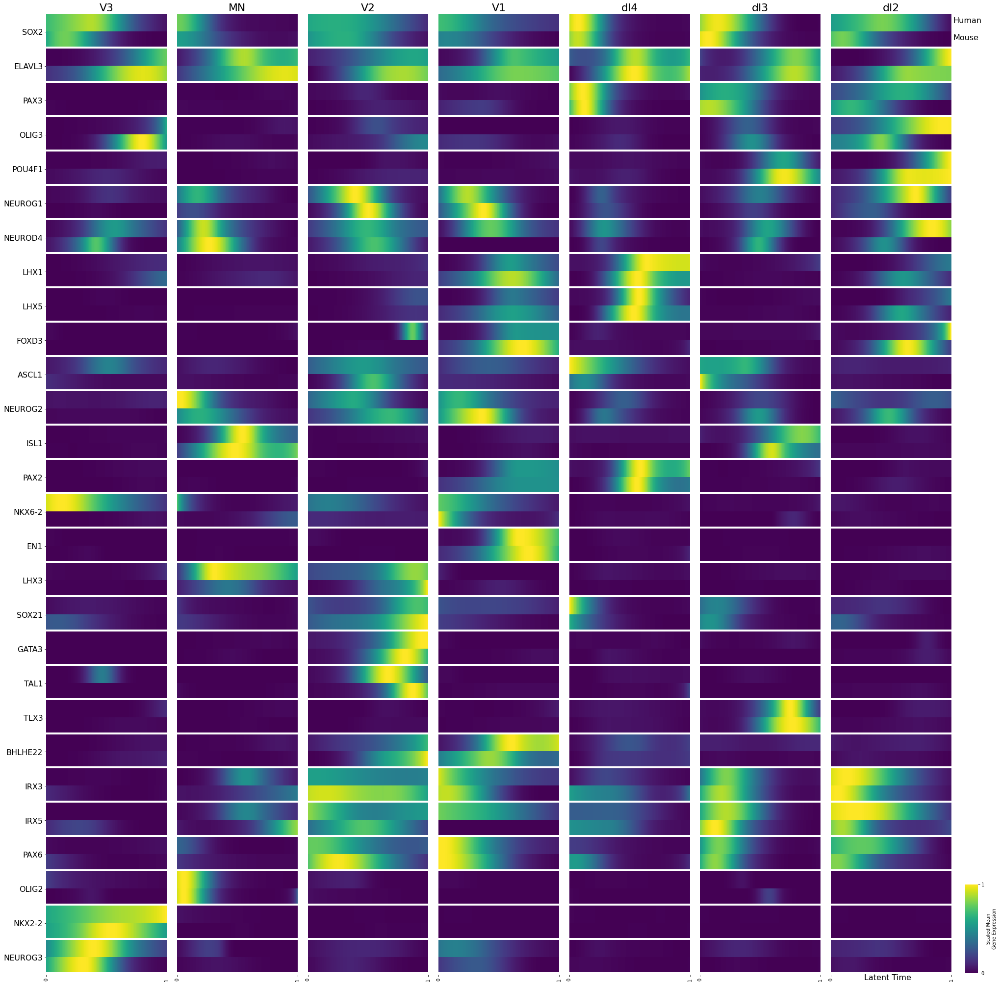

CPU times: user 17min 44s, sys: 6min 54s, total: 24min 39s
Wall time: 23min 59s


In [21]:
%%time
fig = plt.figure(figsize=(4*len(doms),1*len(genes)))
axes = fig.subplots(2*len(genes),len(doms))
for j, dom in enumerate(doms):
    print(dom, end=": ")
    h_dat = hX2[j]
    h_cs = hCS[j]
    h_f = hF[j]
    m_dat = mX2[j]
    m_cs = mCS[j]
    m_f = mF[j]
    for i, g in enumerate(genes):
        print(g, end=' ')
        ax = axes[2*i][j]
#         if h_cs[i] == 1:
#             ax.text(203,0.1,'*', color='red', fontsize=16)
#         if h_f[i] == 1:
#             ax.text(203,0.9,'*', color='blue', fontsize=16)
        if i==0:
            ax.set_title(dom, fontsize=22)
        if (i==len(genes)-1) and (j==len(doms)-1):
            sns.heatmap(h_dat[i,:].reshape(1,-1), ax=ax, cmap='viridis', vmin=0, vmax=1,
                        cbar=False, cbar_kws={'use_gridspec':False, 'anchor':(2.2,0.4), 'shrink':5, 'ticks':[], 'aspect':8}, zorder=1)
        else:
            sns.heatmap(h_dat[i,:].reshape(1,-1), vmin=0, vmax=1, ax=ax, cmap='viridis', cbar=False)
        ax.set_xticks([])
        ax.set_xticklabels([])
        if j==0:
            ax.set_yticks([1])
            ax.set_yticklabels([g], rotation=0, fontsize=16)
        else:
            ax.set_yticks([])
            ax.set_yticklabels([])
            
        
        if j==len(doms)-1 and i==0:
            ax.text(203,0.5,'Human', color='black', zorder=2, rotation=0, fontsize=16)
            
        ax = axes[2*i+1][j]
#         if m_cs[i] == 1:
#             ax.text(203,0.1,'*', color='red', fontsize=16)
#         if m_f[i] == 1:
#             ax.text(203,0.9,'*', color='blue', fontsize=16)
        if j==len(doms)-1 and i==0:
            ax.text(203,0.5,'Mouse', color='black', zorder=2, rotation=0, fontsize=16,)
        
        if (i==len(genes)-1) and (j==len(doms)-1):
            sns.heatmap(m_dat[i,:].reshape(1,-1), ax=ax, cmap='viridis', vmin=0, vmax=1,
                        cbar=True, cbar_kws={'use_gridspec':False, 'anchor':(1,0),
                                             'shrink':7.5, 'ticks':[0,1],'label':'Scaled Mean\nGene Expression', 'aspect':7}, zorder=2)
        else:
            sns.heatmap(m_dat[i,:].reshape(1,-1), vmin=0, vmax=1, ax=ax, cmap='viridis', cbar=False)
        ax.axhline(y=1, color='white', linewidth=10)
        if (i==len(genes)-1):
            ax.set_xticks([0,200])
            ax.set_xticklabels([0,1])
        else:
            ax.set_xticks([])
            ax.set_xticklabels([])
        ax.set_yticks([])
        ax.set_yticklabels([])
    plt.tight_layout(h_pad=-1)
# axes[-1][0].text(205,.5,'Human', color='red', rotation=0)
# axes[-1][1].text(205,.5,'Mouse', color='red', rotation=0)
ax.text(55,1.3,"Latent Time", fontsize=16)
# plt.text(212,-4.98,'Human', color='black', zorder=2, rotation=0, fontsize=16)
# plt.text(212,-4.68,'Mouse', color='black', zorder=2, rotation=0, fontsize=16)
#     axes[-1].set_zorder(1)
plt.savefig('../plots/8_neurogenic_heatmap.png', dpi=300)
plt.show()